<a href="https://colab.research.google.com/github/ninja03jod/Machine_Learning_Projects/blob/main/ML_Model_Predict_Attrition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [ ]:
df = pd.read_csv("/content/general_data.csv")
df

,Age,Attrition,BusinessTravel,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeID,Gender,...,NumCompaniesWorked,Over18,PercentSalaryHike,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager
0,51,No,Travel_Rarely,Sales,6,2,Life Sciences,1,1,Female,...,1.0,Y,11,8,0,1.0,6,1,0,0
1,31,Yes,Travel_Frequently,Research & Development,10,1,Life Sciences,1,2,Female,...,0.0,Y,23,8,1,6.0,3,5,1,4
2,32,No,Travel_Frequently,Research & Development,17,4,Other,1,3,Male,...,1.0,Y,15,8,3,5.0,2,5,0,3
3,38,No,Non-Travel,Research & Development,2,5,Life Sciences,1,4,Male,...,3.0,Y,11,8,3,13.0,5,8,7,5
4,32,No,Travel_Rarely,Research & Development,10,1,Medical,1,5,Male,...,4.0,Y,12,8,2,9.0,2,6,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4405,42,No,Travel_Rarely,Research & Development,5,4,Medical,1,4406,Female,...,3.0,Y,17,8,1,10.0,5,3,0,2
4406,29,No,Travel_Rarely,Research & Development,2,4,Medical,1,4407,Male,...,2.0,Y,15,8,0,10.0,2,3,0,2
4407,25,No,Travel_Rarely,Research & Development,25,2,Life Sciences,1,4408,Male,...,0.0,Y,20,8,0,5.0,4,4,1,2
4408,42,No,Travel_Rarely,Sales,18,2,Medical,1,4409,Male,...,0.0,Y,14,8,1,10.0,2,9,7,8


In [ ]:
# lets check some records and columns
def Info(df):
  print(f"Total Records are:{df.shape}\n")
  print(f"Number of columns we have:{df.shape[1]}\n")
  print(f"Total columns are:\n{df.columns}\n")
  print("*"*170)

  # lets chcek the datatypes and null and non-null values:
  print("Info:\n")
  print(f"{df.info()}\n")
  print(f"Null values:\n{df.isnull().sum()}\n")
  print(f"Duplicate values:\n{df.duplicated().sum()}\n")

  # lets see the output data is in proportion or not:
  print(f"Output data is in proportion of not:\n{df.Attrition.value_counts(normalize=True)*100}\n")
  print(f"Here we dont have the data in proportion so either we use stratifed sampling if we have big dataset or we ahve to use under or over sampling technique")

Info(df)

Total Records are:(4410, 24)

Number of columns we have:24

Total columns are:
Index(['Age', 'Attrition', 'BusinessTravel', 'Department', 'DistanceFromHome',
       'Education', 'EducationField', 'EmployeeCount', 'EmployeeID', 'Gender',
       'JobLevel', 'JobRole', 'MaritalStatus', 'MonthlyIncome',
       'NumCompaniesWorked', 'Over18', 'PercentSalaryHike', 'StandardHours',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'YearsAtCompany', 'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

**************************************************************************************************************************************************************************
Info:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4410 entries, 0 to 4409
Data columns (total 24 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Age                      4410 non-null   int64  
 1

In [ ]:
df.sample(5)

,Age,Attrition,BusinessTravel,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeID,Gender,...,NumCompaniesWorked,Over18,PercentSalaryHike,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager
2724,26,Yes,Travel_Rarely,Sales,4,3,Marketing,1,2725,Male,...,1.0,Y,12,8,0,1.0,6,1,0,1
2244,39,Yes,Non-Travel,Research & Development,2,4,Medical,1,2245,Male,...,2.0,Y,15,8,2,11.0,1,1,0,0
1311,44,No,Non-Travel,Research & Development,23,2,Medical,1,1312,Female,...,4.0,Y,16,8,0,17.0,3,3,1,2
222,30,Yes,Travel_Frequently,Research & Development,9,3,Other,1,223,Male,...,1.0,Y,14,8,0,1.0,2,1,0,0
1236,34,Yes,Travel_Rarely,Sales,15,2,Marketing,1,1237,Female,...,2.0,Y,13,8,0,8.0,2,4,1,3


In [ ]:
# lets reduce the null values
df.NumCompaniesWorked.mean()

2.6948303347756775

In [ ]:
# most of people works in 3 company during their career
# lets fill with null values:
df.NumCompaniesWorked = df.NumCompaniesWorked.fillna(3.0)

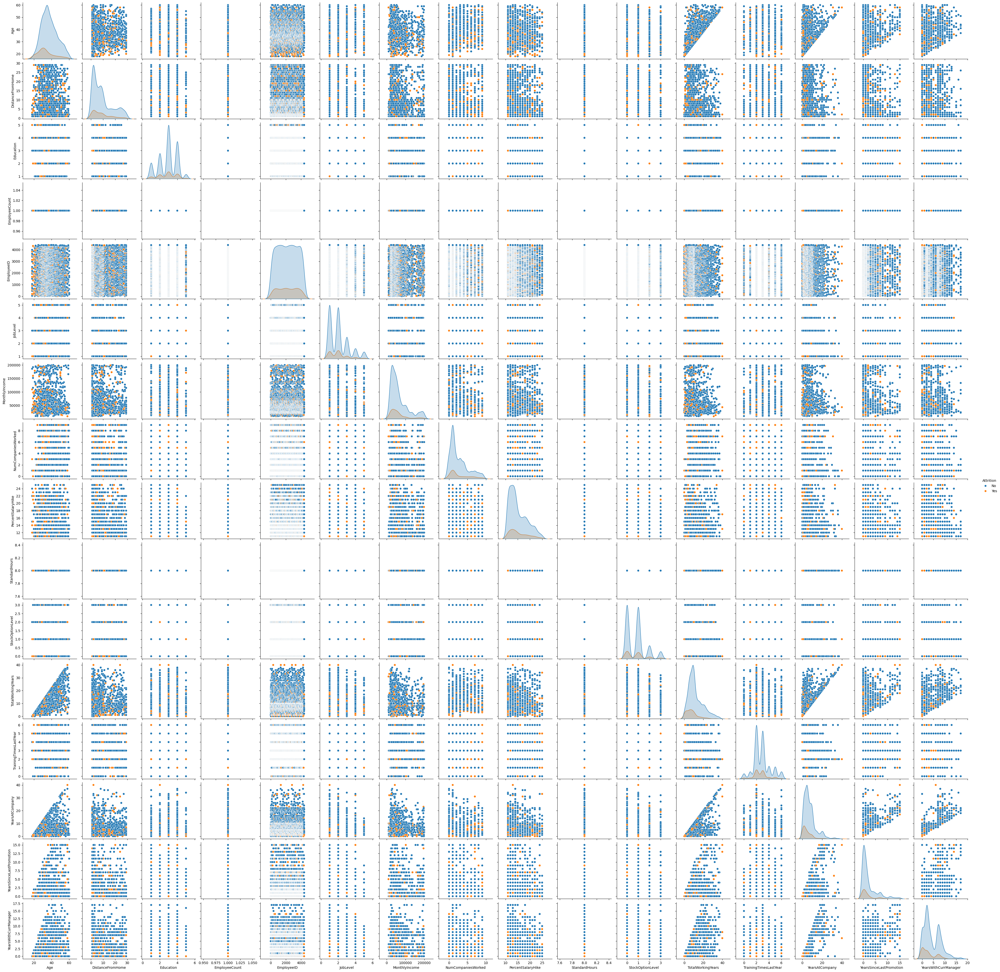

In [ ]:
# To get the batter understanding between each column we have to plot pairplot:
sns.pairplot(data=df,hue="Attrition")

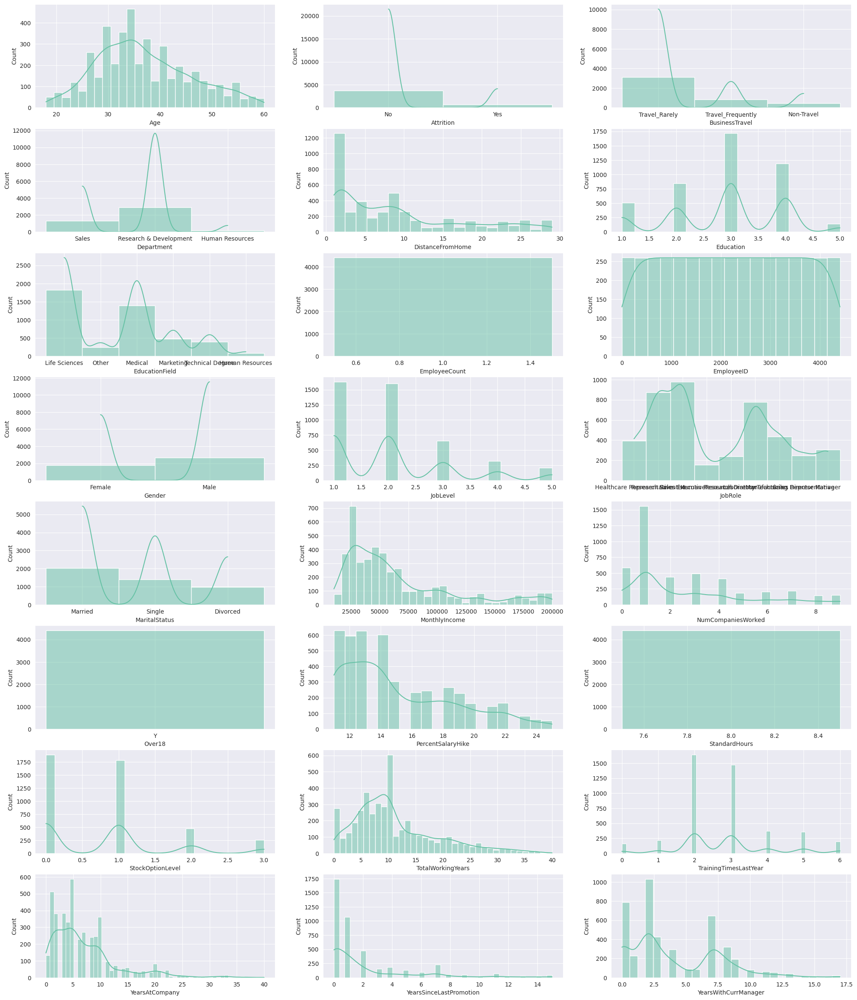

In [ ]:
sns.set_style('darkgrid')
sns.set_palette('Set2')
plt.figure(figsize=(25,30))
col_name = df.columns
i = 1
for col in col_name:
  plt.subplot(8,3,i)
  sns.histplot(df[col],kde=True)
  i+=1

In [ ]:
df.head()

,Age,Attrition,BusinessTravel,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeID,Gender,...,NumCompaniesWorked,Over18,PercentSalaryHike,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager
0,51,No,Travel_Rarely,Sales,6,2,Life Sciences,1,1,Female,...,1.0,Y,11,8,0,1.0,6,1,0,0
1,31,Yes,Travel_Frequently,Research & Development,10,1,Life Sciences,1,2,Female,...,0.0,Y,23,8,1,6.0,3,5,1,4
2,32,No,Travel_Frequently,Research & Development,17,4,Other,1,3,Male,...,1.0,Y,15,8,3,5.0,2,5,0,3
3,38,No,Non-Travel,Research & Development,2,5,Life Sciences,1,4,Male,...,3.0,Y,11,8,3,13.0,5,8,7,5
4,32,No,Travel_Rarely,Research & Development,10,1,Medical,1,5,Male,...,4.0,Y,12,8,2,9.0,2,6,0,4


<Axes: >

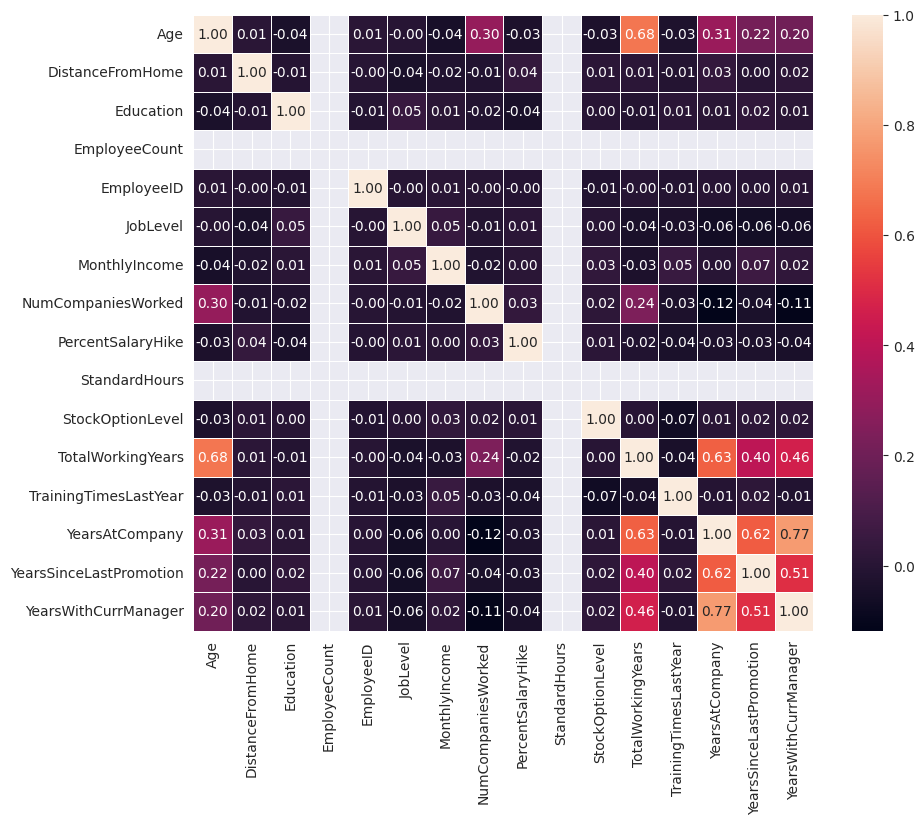

In [ ]:
# lets see the correlation
plt.figure(figsize=(10,8))
sns.heatmap(data=df.corr(),annot=True,fmt=".2f",linewidth=0.5,linecolor="white")

<Axes: xlabel='TotalWorkingYears', ylabel='YearsWithCurrManager'>

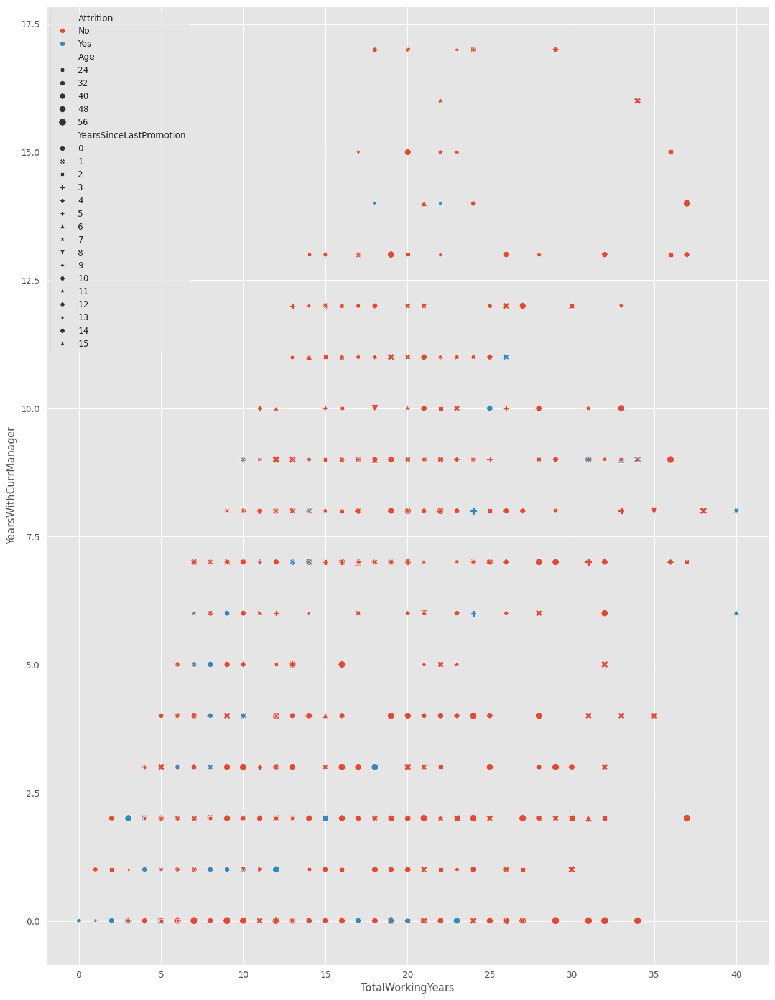

In [ ]:
# lets see the relation between TotalworkingYears with yearswithCuurManager
# both are normally than greater correlated with each other
plt.figure(figsize=(15,20))
plt.style.use("ggplot")
sns.scatterplot(data=df,x="TotalWorkingYears",y="YearsWithCurrManager",hue="Attrition",style="YearsSinceLastPromotion",size="Age")

In [ ]:
cat_col = df.select_dtypes(object)
cat_col.columns

Index(['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender',
       'JobRole', 'MaritalStatus', 'Over18'],
      dtype='object')

In [ ]:
num_col = df.select_dtypes([int,float])
num_col.columns

Index(['Age', 'DistanceFromHome', 'Education', 'EmployeeCount', 'EmployeeID',
       'JobLevel', 'MonthlyIncome', 'NumCompaniesWorked', 'PercentSalaryHike',
       'StandardHours', 'StockOptionLevel', 'TotalWorkingYears',
       'TrainingTimesLastYear', 'YearsAtCompany', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [ ]:
sns.set_style("darkgrid")
sns.set_palette("Set2")

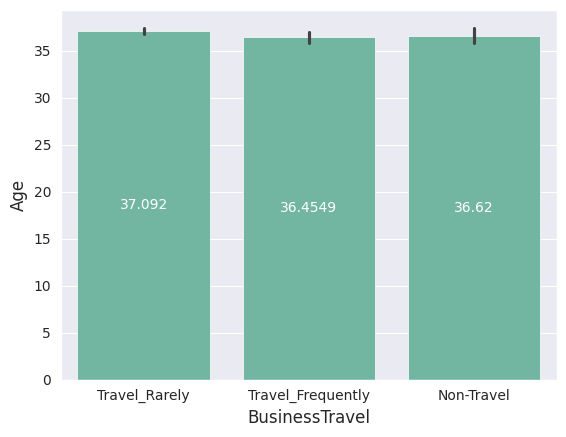

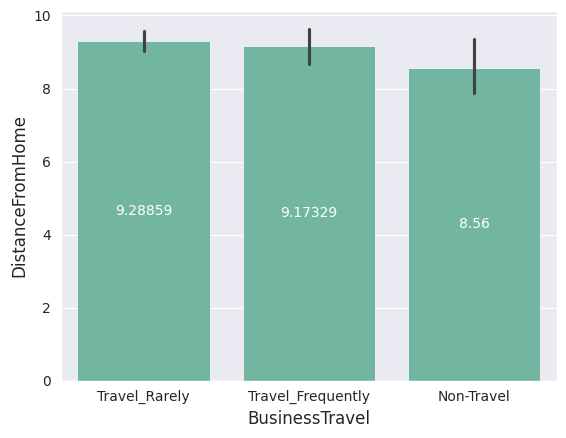

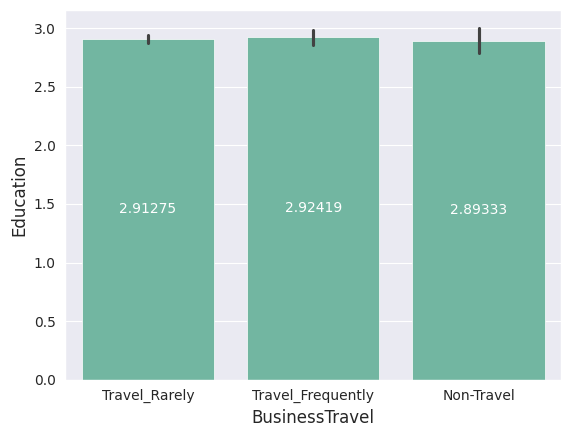

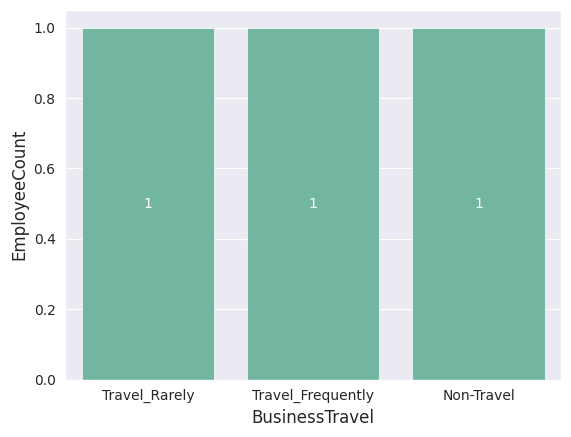

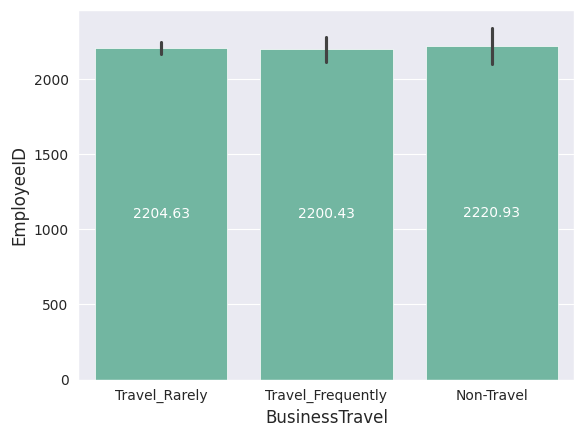

...

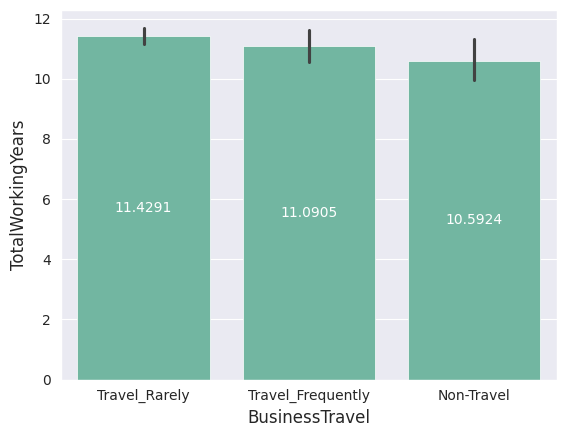

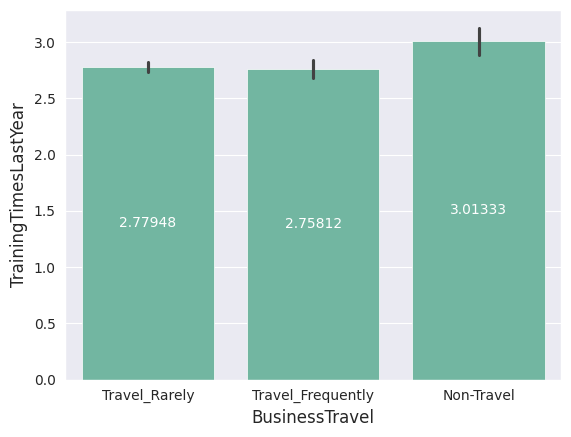

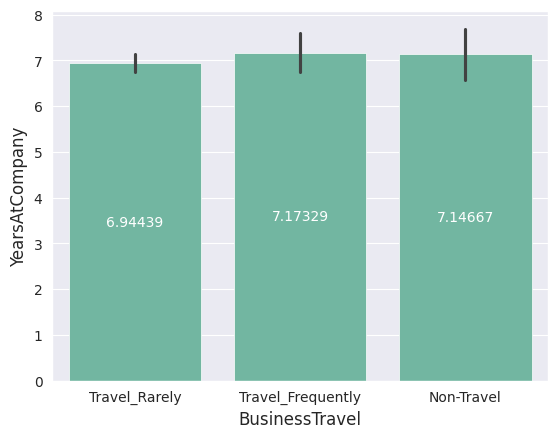

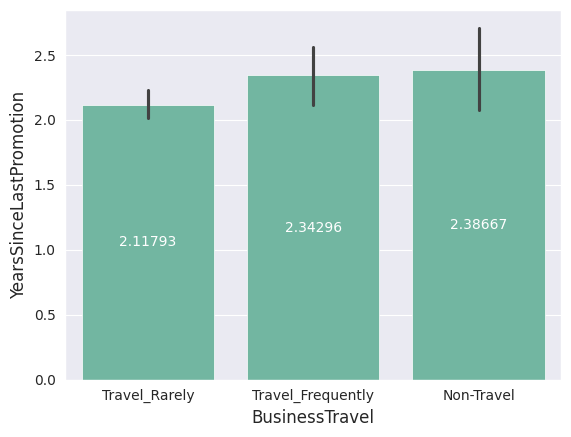

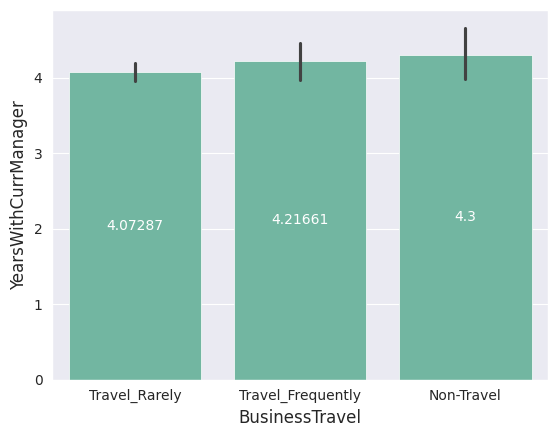

In [ ]:
for col in num_col.columns:
  bar = sns.barplot(data=df,x="BusinessTravel",y=col)
  plt.bar_label(bar.containers[0],label_type="center",color="white")
  plt.show()

In [ ]:
# lets see the Age wise salary hike:
hike = df.groupby(['Age','Attrition'])[['PercentSalaryHike']].count().reset_index()
hike

,Age,Attrition,PercentSalaryHike
0,18,No,12
1,18,Yes,12
2,19,No,9
3,19,Yes,18
4,20,No,15
...,...,...,...
77,57,No,12
78,58,No,27
79,58,Yes,15
80,59,No,30


<Axes: xlabel='Age', ylabel='PercentSalaryHike'>

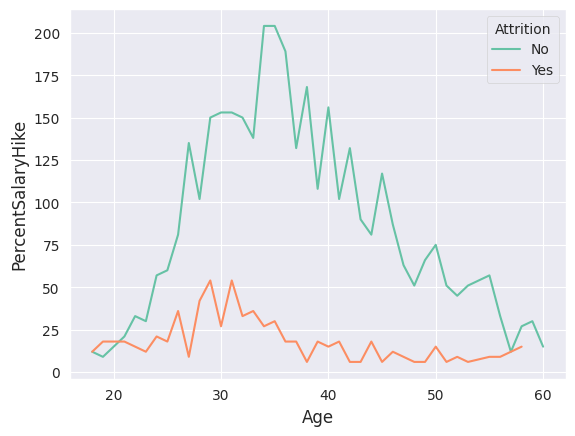

In [ ]:
# lets see with line plot:
sns.lineplot(data=hike,x="Age",y="PercentSalaryHike",hue="Attrition")

In [ ]:
df.head()

,Age,Attrition,BusinessTravel,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeID,Gender,...,NumCompaniesWorked,Over18,PercentSalaryHike,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager
0,51,No,Travel_Rarely,Sales,6,2,Life Sciences,1,1,Female,...,1.0,Y,11,8,0,1.0,6,1,0,0
1,31,Yes,Travel_Frequently,Research & Development,10,1,Life Sciences,1,2,Female,...,0.0,Y,23,8,1,6.0,3,5,1,4
2,32,No,Travel_Frequently,Research & Development,17,4,Other,1,3,Male,...,1.0,Y,15,8,3,5.0,2,5,0,3
3,38,No,Non-Travel,Research & Development,2,5,Life Sciences,1,4,Male,...,3.0,Y,11,8,3,13.0,5,8,7,5
4,32,No,Travel_Rarely,Research & Development,10,1,Medical,1,5,Male,...,4.0,Y,12,8,2,9.0,2,6,0,4


In [ ]:
# Department wise count of people in orgaization
Dept = df.groupby("Department")[['Attrition']].value_counts().reset_index(name="Counts")
Dept

,Department,Attrition,Counts
0,Human Resources,No,132
1,Human Resources,Yes,57
2,Research & Development,No,2430
3,Research & Development,Yes,453
4,Sales,No,1137
5,Sales,Yes,201


Text(0.5, 1.0, 'Department wise peoples counts Those are Expereinced Attrition or Not')

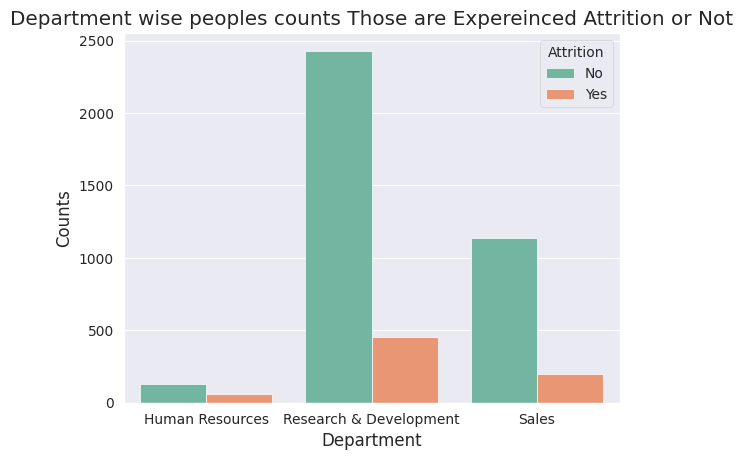

In [ ]:
# lets see by bar plot:
sns.barplot(data=Dept,x="Department",y="Counts",hue="Attrition")
plt.title("Department wise peoples counts Those are Expereinced Attrition or Not")

<Axes: xlabel='TotalWorkingYears', ylabel='Counts'>

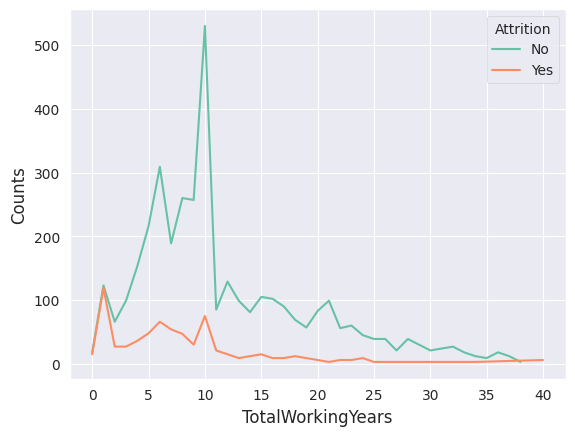

In [ ]:
# lets see the monthly income with Total working years:
Tot_Work = df.groupby(["TotalWorkingYears","Attrition"])[['MonthlyIncome']].count().reset_index()
Tot_Work.rename(columns={"MonthlyIncome":"Counts"},inplace=True)
sns.lineplot(data=Tot_Work,x="TotalWorkingYears",y="Counts",hue="Attrition")

In [ ]:
# Another approch
df.groupby("TotalWorkingYears")[['Attrition']].value_counts()

TotalWorkingYears  Attrition
0.0                No            18
                   Yes           15
1.0                No           123
                   Yes          119
2.0                No            66
                               ... 
35.0               No             9
36.0               No            18
37.0               No            12
38.0               No             3
40.0               Yes            6
Length: 71, dtype: int64

Text(0.5, 1.0, 'Attrition vs. No Attrition Across Years Since Last Promotion')

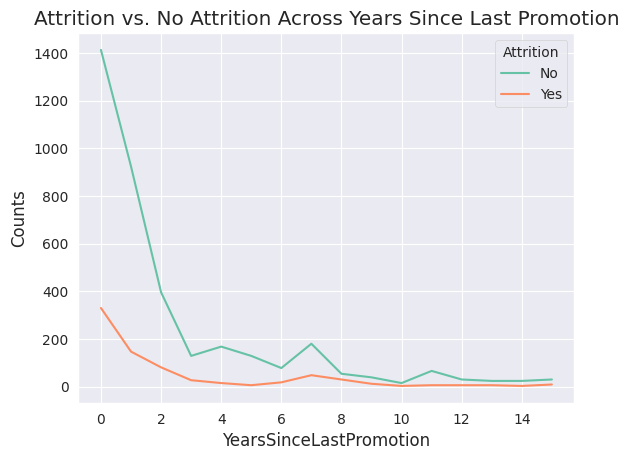

In [ ]:
# lets see the years since last promotion wrt to attrition:
Promo = df.groupby("YearsSinceLastPromotion")[['Attrition']].value_counts().reset_index(name="Counts")
sns.lineplot(data=Promo,x="YearsSinceLastPromotion",y="Counts",hue="Attrition")
plt.title("Attrition vs. No Attrition Across Years Since Last Promotion")

Text(0.5, 1.0, 'Attrtion vs No Attrition Peoples who get Their Manager Position across Current Year\n')

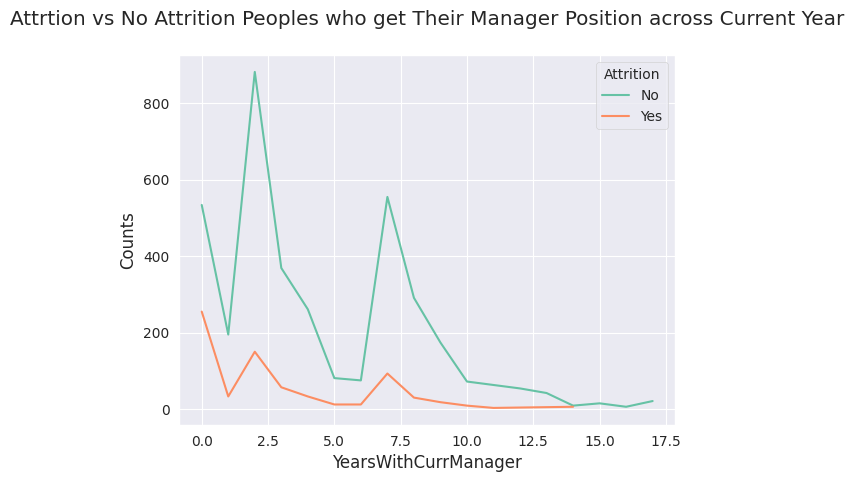

In [ ]:
# Lets see how many are curr managers get expereinced with attrition and No attrition
Manage = df.groupby("YearsWithCurrManager")[['Attrition']].value_counts().reset_index(name="Counts")
sns.lineplot(data=Manage,x="YearsWithCurrManager",y="Counts",hue="Attrition")
plt.title("Attrtion vs No Attrition Peoples who get Their Manager Position across Current Year\n")

In [ ]:
cat_col.columns

Index(['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender',
       'JobRole', 'MaritalStatus', 'Over18'],
      dtype='object')

In [ ]:
num_col.columns

Index(['Age', 'DistanceFromHome', 'Education', 'EmployeeCount', 'EmployeeID',
       'JobLevel', 'MonthlyIncome', 'NumCompaniesWorked', 'PercentSalaryHike',
       'StandardHours', 'StockOptionLevel', 'TotalWorkingYears',
       'TrainingTimesLastYear', 'YearsAtCompany', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [ ]:
ndf = pd.read_csv("/content/general_data.csv")

In [ ]:
# lets see the relation between Each Departments employees who performs Attrition:
# This will work as value counts but value counts gives output with reverse alphabet and descneding order
# here count and cross tab gives output in ascending order
pd.crosstab(ndf['Department'],ndf['Attrition'])

Attrition,No,Yes
Department,,
Human Resources,132,57
Research & Development,2430,453
Sales,1137,201


In this case Same behaviour of each Department employees Experienced Attrition

Totally different behaviour of each Department employees who not Experienced Attrition



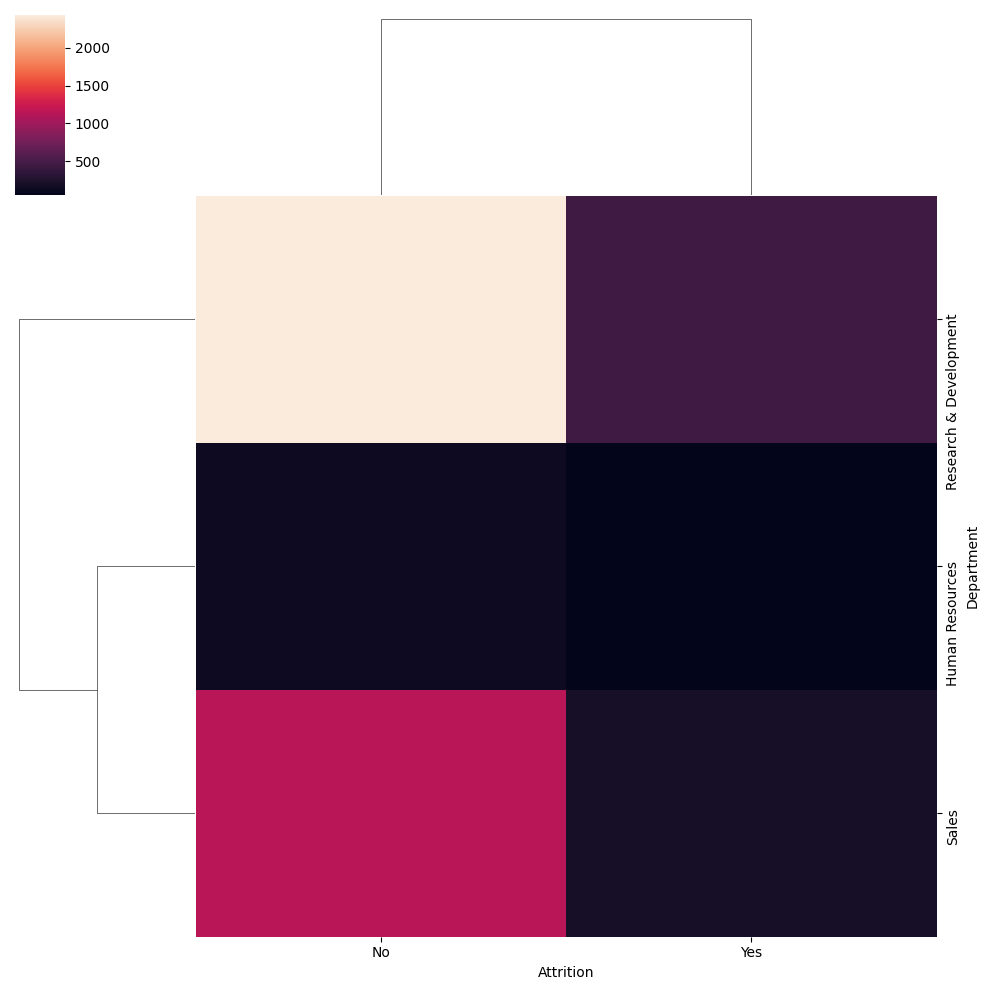

In [ ]:
# lets see their behaviour
sns.clustermap(data=(pd.crosstab(ndf['Department'],ndf['Attrition'])))
print(f"In this case Same behaviour of each Department employees Experienced Attrition\n")
print(f"Totally different behaviour of each Department employees who not Experienced Attrition\n")

In [ ]:
# Accoridng to level of job lets see percent salary hike:
level = df.groupby(["JobLevel"])[['PercentSalaryHike']].value_counts().reset_index()
level.pivot_table(values="PercentSalaryHike",index="JobLevel")

,PercentSalaryHike
JobLevel,
1,18.000000
2,18.000000
3,17.642857
4,18.000000
5,17.000000


<Axes: ylabel='JobLevel'>

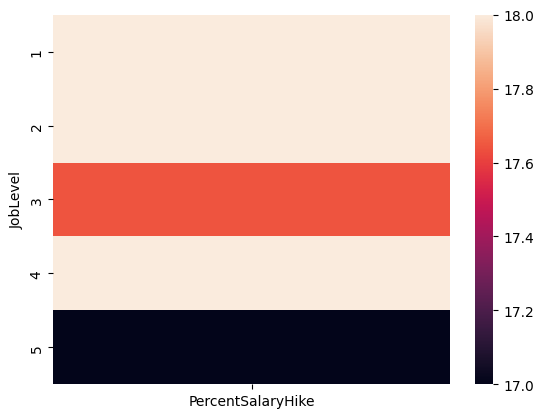

In [ ]:
sns.heatmap(data=level.pivot_table(values="PercentSalaryHike",index="JobLevel"))

In [ ]:
# Here are Education level of Employees:
#1: Below College: Employees with an education level below college.
#2: College: Employees with a college-level education.
#3: Bachelor: Employees with a bachelor's degree.
#4: Master: Employees with a master's degree.
#5: Doctor: Employees with a doctorate or a higher-level degree.
# lets conver this numeric levels to labels:
ndf.Education.replace({1:"Below College",2:"College",3:"Bachelor",4:"Master",5:"Doctor"},inplace=True)

In [ ]:
# lets see which type of deprtament got and their salary hike:
Ed = ndf.groupby(["Education","Department","Attrition"])[['PercentSalaryHike']].value_counts().reset_index(name="coulmns")
Ed

,Education,Department,Attrition,PercentSalaryHike,coulmns
0,Bachelor,Human Resources,No,13,15
1,Bachelor,Human Resources,No,15,9
2,Bachelor,Human Resources,No,11,6
3,Bachelor,Human Resources,No,22,6
4,Bachelor,Human Resources,No,21,6
...,...,...,...,...,...
248,Master,Sales,Yes,15,3
249,Master,Sales,Yes,19,3
250,Master,Sales,Yes,22,3
251,Master,Sales,Yes,24,3


In [ ]:
# lets plot the percentage salary hike as per Education level:
Ed.pivot_table(values="PercentSalaryHike",index=["Education","Department"])

PercentSalaryHike
Education     Department                               
Bachelor      Human Resources                 16.166667
              Research & Development          17.607143
              Sales                           17.240000
Below College Human Resources                 15.666667
              Research & Development          17.625000
              Sales                           17.000000
College       Human Resources                 15.250000
              Research & Development          17.840000
              Sales                           17.130435
Doctor        Human Resources                 14.500000
              Research & Development          15.416667
              Sales                           15.142857
Master        Human Resources                 14.800000
              Research & Development          18.000000
              Sales                           17.760000

Text(0.5, 1.0, 'Salary Hike According Education Level Across all Department\n')

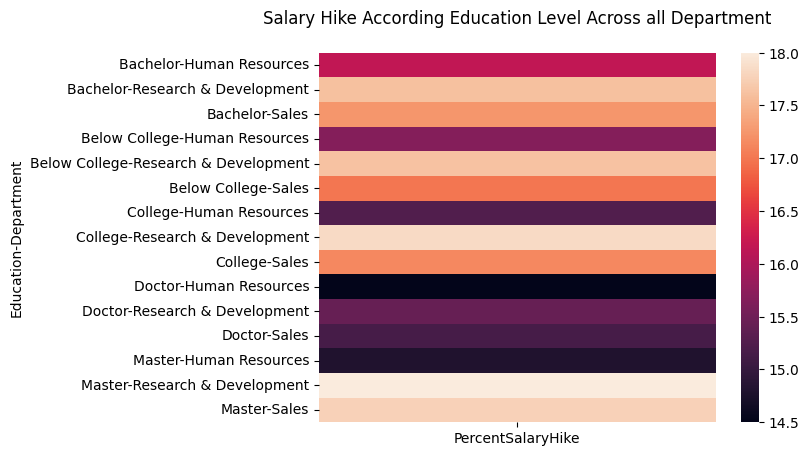

In [ ]:
sns.heatmap(data=Ed.pivot_table(values="PercentSalaryHike",index=["Education","Department"]))
plt.title("Salary Hike According Education Level Across all Department\n")

Blue bar with No Attrition and Orange bar is of Attition



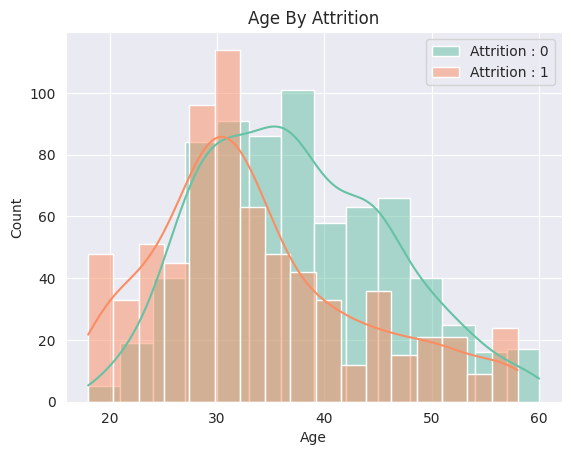

In [ ]:
# lets Age by Attrition
sns.histplot(df_undersample[df_undersample.Attrition == 0]['Age'],kde=True,label="Attrition : 0")
sns.histplot(df_undersample[df_undersample.Attrition == 1]['Age'],kde=True,label="Attrition : 1")
plt.legend()
plt.title("Age By Attrition")
print(f"Blue bar with No Attrition and Orange bar is of Attition\n")

In [ ]:
# Lets see is there any under age of 18:
ndf.Over18.value_counts()

Y    4410
Name: Over18, dtype: int64

In [ ]:
# count of attrition with theri department and education field
dept1 = Dept[Dept.Attrition=="No"].value_counts().reset_index()
dept2 = Dept[Dept.Attrition =="Yes"].value_counts().reset_index()
display(dept1,dept2)

,Department,Attrition,Counts,0
0,Human Resources,No,132,1
1,Research & Development,No,2430,1
2,Sales,No,1137,1


,Department,Attrition,Counts,0
0,Human Resources,Yes,57,1
1,Research & Development,Yes,453,1
2,Sales,Yes,201,1


In [ ]:
Education = df.groupby("EducationField")[['Attrition']].value_counts().reset_index(name="counts")
Edu1 = Education[Education.Attrition == "No"].value_counts().reset_index()
Edu2 = Education[Education.Attrition == "Yes"].value_counts().reset_index()
display(Edu1,Edu2)

,EducationField,Attrition,counts,0
0,Human Resources,No,48,1
1,Life Sciences,No,1515,1
2,Marketing,No,402,1
3,Medical,No,1167,1
4,Other,No,216,1
5,Technical Degree,No,351,1


,EducationField,Attrition,counts,0
0,Human Resources,Yes,33,1
1,Life Sciences,Yes,303,1
2,Marketing,Yes,75,1
3,Medical,Yes,225,1
4,Other,Yes,30,1
5,Technical Degree,Yes,45,1


Text(0.5, 0.98, 'Attrition vs No Attrition w.r.t Each Department and EducationField')

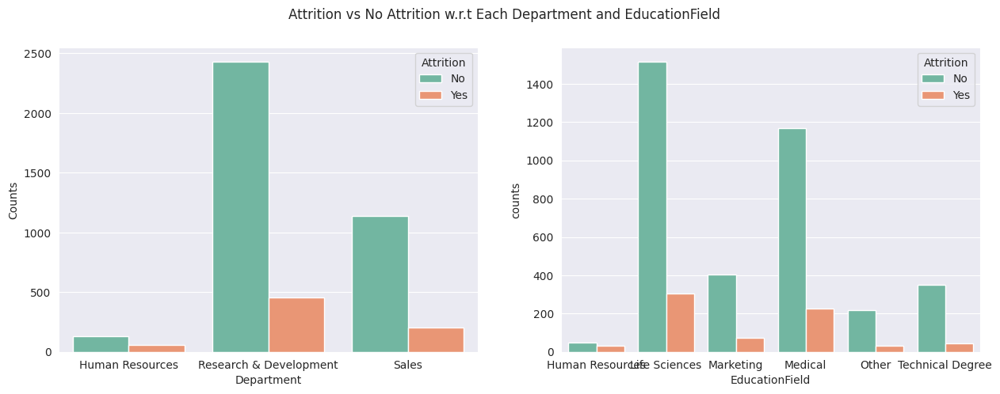

In [ ]:
fig,axis = plt.subplots(ncols=2,nrows=1,figsize=(15,5))
sns.set_style("darkgrid")
sns.set_palette("Set2")
sns.barplot(data=Dept,x="Department",y="Counts",hue="Attrition",ax=axis[0])
sns.barplot(data=Education,x="EducationField",y="counts",hue="Attrition",ax=axis[1])
plt.suptitle("Attrition vs No Attrition w.r.t Each Department and EducationField")

Text(0.5, 1.0, 'People who Experienced Attrition')

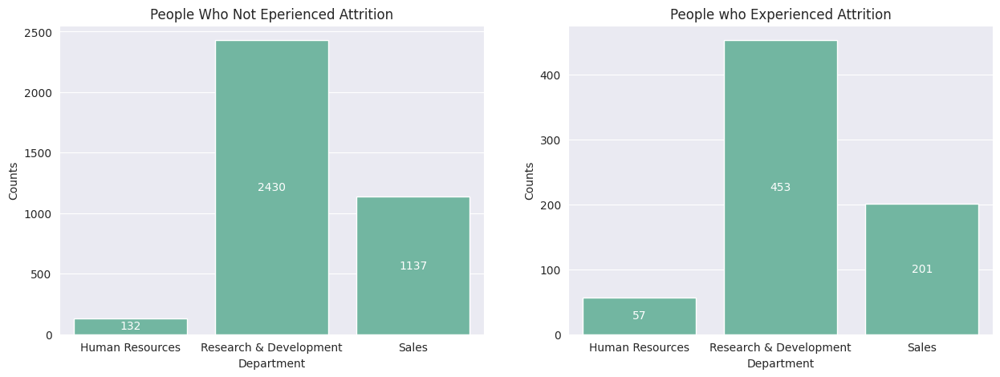

In [ ]:
# We can plot separatly for clear understanding between Attrition vs No Attrition wrt Dept.
plt.figure(figsize=(15,5))
plt.subplot(121)
bar = sns.barplot(data=dept1,x="Department",y="Counts")
plt.bar_label(bar.containers[0],label_type="center",color="white")
plt.title("People Who Not Eperienced Attrition")
plt.subplot(122)
bar = sns.barplot(data=dept2,x="Department",y="Counts")
plt.bar_label(bar.containers[0],label_type="center",color="white")
plt.title("People who Experienced Attrition")

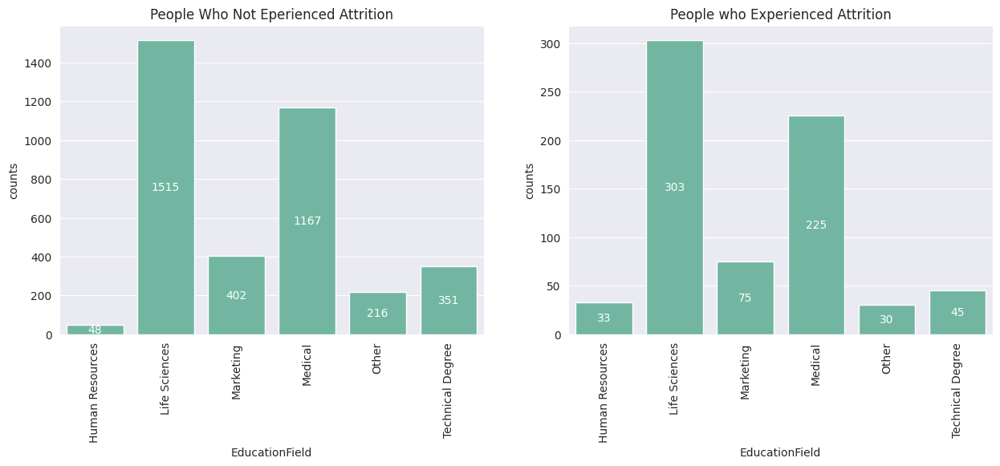

In [ ]:
# We can plot separatly for clear understanding between Attrition vs No Attrition wrt EducationField
plt.figure(figsize=(15,5))
plt.subplot(121)
bar = sns.barplot(data=Edu1,x="EducationField",y="counts")
plt.bar_label(bar.containers[0],label_type="center",color="white")
plt.title("People Who Not Eperienced Attrition")
plt.xticks(rotation=90)
plt.subplot(122)
bar = sns.barplot(data=Edu2,x="EducationField",y="counts")
plt.bar_label(bar.containers[0],label_type="center",color="white")
plt.title("People who Experienced Attrition")
plt.xticks(rotation=90);

In [ ]:
df.head()

,Age,Attrition,BusinessTravel,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeID,Gender,...,NumCompaniesWorked,Over18,PercentSalaryHike,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager
0,51,No,Travel_Rarely,Sales,6,2,Life Sciences,1,1,Female,...,1.0,Y,11,8,0,1.0,6,1,0,0
1,31,Yes,Travel_Frequently,Research & Development,10,1,Life Sciences,1,2,Female,...,0.0,Y,23,8,1,6.0,3,5,1,4
2,32,No,Travel_Frequently,Research & Development,17,4,Other,1,3,Male,...,1.0,Y,15,8,3,5.0,2,5,0,3
3,38,No,Non-Travel,Research & Development,2,5,Life Sciences,1,4,Male,...,3.0,Y,11,8,3,13.0,5,8,7,5
4,32,No,Travel_Rarely,Research & Development,10,1,Medical,1,5,Male,...,4.0,Y,12,8,2,9.0,2,6,0,4


In [ ]:
# We have to import libarar to build the model:
from sklearn.preprocessing import LabelEncoder,StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix,recall_score,precision_score,f1_score

### ***Label Encoding***
###### ***Used to convert categorical columns to numerical***

In [ ]:
encode = LabelEncoder()

In [ ]:
for i in cat_col.columns:
  df[i] = encode.fit_transform(df[i])

In [ ]:
X = df.drop(columns=['Attrition'])
y = df['Attrition']
display(X,y)

,Age,BusinessTravel,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeID,Gender,JobLevel,...,NumCompaniesWorked,Over18,PercentSalaryHike,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager
0,51,2,2,6,2,1,1,1,0,1,...,1.0,0,11,8,0,1.0,6,1,0,0
1,31,1,1,10,1,1,1,2,0,1,...,0.0,0,23,8,1,6.0,3,5,1,4
2,32,1,1,17,4,4,1,3,1,4,...,1.0,0,15,8,3,5.0,2,5,0,3
3,38,0,1,2,5,1,1,4,1,3,...,3.0,0,11,8,3,13.0,5,8,7,5
4,32,2,1,10,1,3,1,5,1,1,...,4.0,0,12,8,2,9.0,2,6,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4405,42,2,1,5,4,3,1,4406,0,1,...,3.0,0,17,8,1,10.0,5,3,0,2
4406,29,2,1,2,4,3,1,4407,1,1,...,2.0,0,15,8,0,10.0,2,3,0,2
4407,25,2,1,25,2,1,1,4408,1,2,...,0.0,0,20,8,0,5.0,4,4,1,2
4408,42,2,2,18,2,3,1,4409,1,1,...,0.0,0,14,8,1,10.0,2,9,7,8


0       0
1       1
2       0
3       0
4       0
       ..
4405    0
4406    0
4407    0
4408    0
4409    0
Name: Attrition, Length: 4410, dtype: int64

### ***Standardization***
###### ***Standard Scaler used when we have faetures with larger value and some features with values in decimal and standard scaler gives values with mean of 0 and standard deviation will be 1***

In [ ]:
scaler = StandardScaler()
scaler

StandardScaler()

In [ ]:
X = scaler.fit_transform(X)

In [ ]:
X

array([[ 1.54136892,  0.59004834,  1.40151234, ..., -0.98101416,
        -0.67914568, -1.15593471],
       [-0.64866811, -0.91319439, -0.49381714, ..., -0.32789332,
        -0.36871529, -0.03451975],
       [-0.53916626, -0.91319439, -0.49381714, ..., -0.32789332,
        -0.67914568, -0.31487349],
       ...,
       [-1.30567922,  0.59004834, -0.49381714, ..., -0.49117353,
        -0.36871529, -0.59522723],
       [ 0.55585225,  0.59004834,  1.40151234, ...,  0.32522752,
         1.49386709,  1.08689522],
       [ 0.33684855,  0.59004834, -0.49381714, ...,  2.28459003,
         0.25214551,  1.36724896]])

### ***Modeling***

In [ ]:
model = LogisticRegression()
model

LogisticRegression()

### ***Data Splittig***
##### ***Data Splitting we are performing here beacuse we have to use stratified sampling technique dute to output data is baised towards No Attrition, So it may creates some problem while we are going to face unseen data through our model. So we are using Stratified samplin to get the data in proportion and if we are not getting output as expected then we have to use Over or Under sampling.***

In [ ]:
x_train,x_test,y_train,y_test = train_test_split(X,y,stratify=y)

In [ ]:
y_train.value_counts(normalize=True)*100

0    83.882673
1    16.117327
Name: Attrition, dtype: float64

### ***Under Sampling technique***
##### ***Used to reduce the number of instances of Majority class --> No Attrition = 0***

In [ ]:
from sklearn.utils import resample

In [ ]:
df.Attrition.value_counts()

0    3699
1     711
Name: Attrition, dtype: int64

In [ ]:
majority_No = df[df.Attrition == 0]
df_undersample_majority = resample(majority_No,replace=True,n_samples=len(df[df.Attrition == 1]),random_state=0)
print(f"After reducing Majority class 0 reuslt is:{df_undersample_majority.Attrition.value_counts()}\n")
df_undersample = pd.concat([df[df.Attrition == 1],df_undersample_majority])
print(f"After reducing no of instances of majority class 0 now proportion data will be:\n{df_undersample.Attrition.value_counts(normalize=True)*100}")

After reducing Majority class 0 reuslt is:0    711
Name: Attrition, dtype: int64

After reducing no of instances of majority class 0 now proportion data will be:
1    50.0
0    50.0
Name: Attrition, dtype: float64


In [ ]:
# Lets use in data splitting:
X = df_undersample.drop(columns=['Attrition'])
y = df_undersample['Attrition']
X.TotalWorkingYears = X.TotalWorkingYears.fillna(3.0)

In [ ]:
# perform standardization:
X = scaler.fit_transform(X)

In [ ]:
X

array([[-0.47594532, -0.94742154, -0.44560143, ..., -0.19135825,
        -0.34182549,  0.13765282],
       [-0.79418712,  0.62095265, -0.44560143, ..., -1.0524704 ,
        -0.66161224, -1.04329623],
       [ 1.22134431, -2.51579573, -0.44560143, ...,  0.66975389,
         2.21646846,  1.61383913],
       ...,
       [ 1.53958612,  0.62095265, -0.44560143, ..., -0.88024797,
        -0.66161224, -1.04329623],
       [-0.79418712,  0.62095265, -0.44560143, ...,  0.32530903,
        -0.34182549,  1.0233646 ],
       [ 0.7970219 , -0.94742154, -0.44560143, ..., -0.19135825,
        -0.02203875, -0.45282171]])

In [ ]:
x_train,x_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=42)

In [ ]:
# training:
model.fit(x_train,y_train)

LogisticRegression()

In [ ]:
# test:
y_pred = model.predict(x_test)
y_pred

array([1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0,
       0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1,
       0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1,
       1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0,
       1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1,
       0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1,
       1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0,
       1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0,
       1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0,
       0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0])

In [ ]:
y_test.values

array([1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1,
       1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1,
       1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1,
       0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0,
       0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0,
       1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1,
       1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0,
       0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1,
       1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0,
       1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0,
       0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0])

### ***Performance measure:***

In [ ]:
# Accuracy score:
accuracy_score(y_test,y_pred)*100

64.91228070175438

In [ ]:
confusion_matrix(y_test,y_pred)

array([[90, 51],
       [49, 95]])

In [ ]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.65      0.64      0.64       141
           1       0.65      0.66      0.66       144

    accuracy                           0.65       285
   macro avg       0.65      0.65      0.65       285
weighted avg       0.65      0.65      0.65       285



In this case:

Here for 141 People with No Attrition occurs and for 144 people experienced Attrition

Out of 144 people --> model predicts that for 90 people will not expereinced Attrition so these statment lies under True Negative Category

Remaning 51 employee who will not expereinced Attritin but model predicts that they expereinced --> False positive

Out of 144 Employee --> model predicts that for 95 employees  expereinced Attrition--> True Positive

Remaning 49 who actually experieced Attrition but model predicting they Not experienced --> Flase Negative



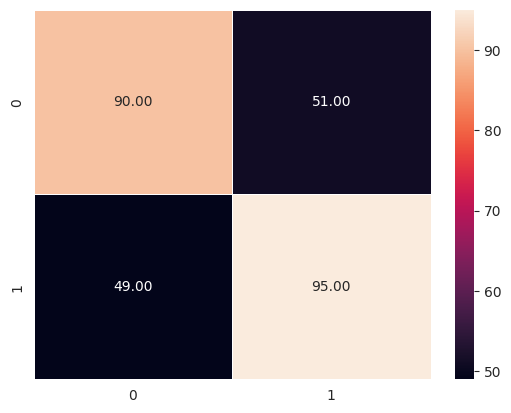

In [ ]:
sns.heatmap(data=confusion_matrix(y_test,y_pred),annot=True,fmt=".2f",linewidth=0.5,linecolor="white")
print("In this case:\n")
print("Here for 141 People with No Attrition occurs and for 144 people experienced Attrition\n")
print("Out of 144 people --> model predicts that for 90 people will not expereinced Attrition so these statment lies under True Negative Category\n")
print("Remaning 51 employee who will not expereinced Attritin but model predicts that they expereinced --> False positive\n")
print("Out of 144 Employee --> model predicts that for 95 employees  expereinced Attrition--> True Positive\n")
print("Remaning 49 who actually experieced Attrition but model predicting they Not experienced --> Flase Negative\n")

In [ ]:
# Recall score: Accuracy of Positive prediction done by model
recall_score(y_test,y_pred)*100

65.97222222222221

In [ ]:
# precision score: accuracy of positive prediction done y the model
precision_score(y_test,y_pred)*100

65.06849315068493

<Axes: >

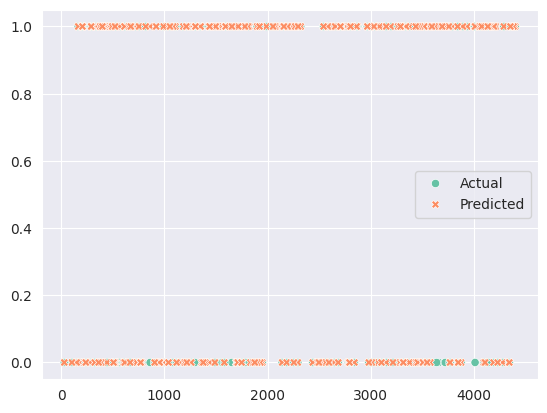

In [ ]:
Log = pd.DataFrame({"Actual":y_test,"Predicted":y1_pred})
sns.scatterplot(data=Log)

### ***DecisionTreeClassifier***

In [ ]:
clf = DecisionTreeClassifier()

In [ ]:
# training:
clf.fit(x_train,y_train)

DecisionTreeClassifier()

In [ ]:
# test:
y1_pred = clf.predict(x_test)
y1_pred

array([1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1,
       1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1,
       1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0,
       0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0,
       1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1,
       1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1,
       0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0,
       1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1,
       1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1,
       1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1,
       0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1])

In [ ]:
y_test.values

array([1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1,
       1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1,
       1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1,
       0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0,
       0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0,
       1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1,
       1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0,
       0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1,
       1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0,
       1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0,
       0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0])

In [ ]:
# model accuracy:
accuracy_score(y_test,y1_pred)*100

89.47368421052632

In [ ]:
# Here we are getting better accuracy with DecsionTreeClassifier:

In [ ]:
confusion_matrix(y_test,y1_pred)

array([[112,  29],
       [  1, 143]])

In [ ]:
print(classification_report(y_test,y1_pred))

              precision    recall  f1-score   support

           0       0.99      0.79      0.88       141
           1       0.83      0.99      0.91       144

    accuracy                           0.89       285
   macro avg       0.91      0.89      0.89       285
weighted avg       0.91      0.89      0.89       285



In this case:

Here for 141 People with No Attrition occurs and for 144 people experienced Attrition

Out of 144 people --> model predicts that for 112 people will not expereinced Attrition so these statment lies under True Negative Category

Remaning 29 employee who will not expereinced Attritin but model predicts that they expereinced --> False positive

Out of 144 Employee --> model predicts that for 143 employees  expereinced Attrition--> True Positive

Remaning 1 who actually experieced Attrition but model predicting they Not experienced --> False Negative



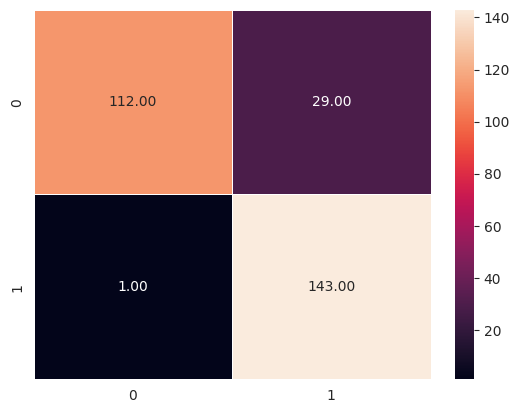

In [ ]:
sns.heatmap(data=confusion_matrix(y_test,y1_pred),annot=True,fmt=".2f",linewidth=0.5,linecolor="white")
print("In this case:\n")
print("Here for 141 People with No Attrition occurs and for 144 people experienced Attrition\n")
print("Out of 144 people --> model predicts that for 112 people will not expereinced Attrition so these statment lies under True Negative Category\n")
print("Remaning 29 employee who will not expereinced Attritin but model predicts that they expereinced --> False positive\n")
print("Out of 144 Employee --> model predicts that for 143 employees  expereinced Attrition--> True Positive\n")
print("Remaning 1 who actually experieced Attrition but model predicting they Not experienced --> False Negative\n")

In [ ]:
# recall score: Accuracy of Positive predictions done by the model
recall_score(y_test,y1_pred)*100

99.30555555555556

In [ ]:
# precison score: accuracy of negative predictions done by the model
precision_score(y_test,y1_pred)*100

83.13953488372093

In [ ]:
# harmonic mean of precision adn accuracy:
f1_score(y_test,y1_pred)

0.9050632911392406

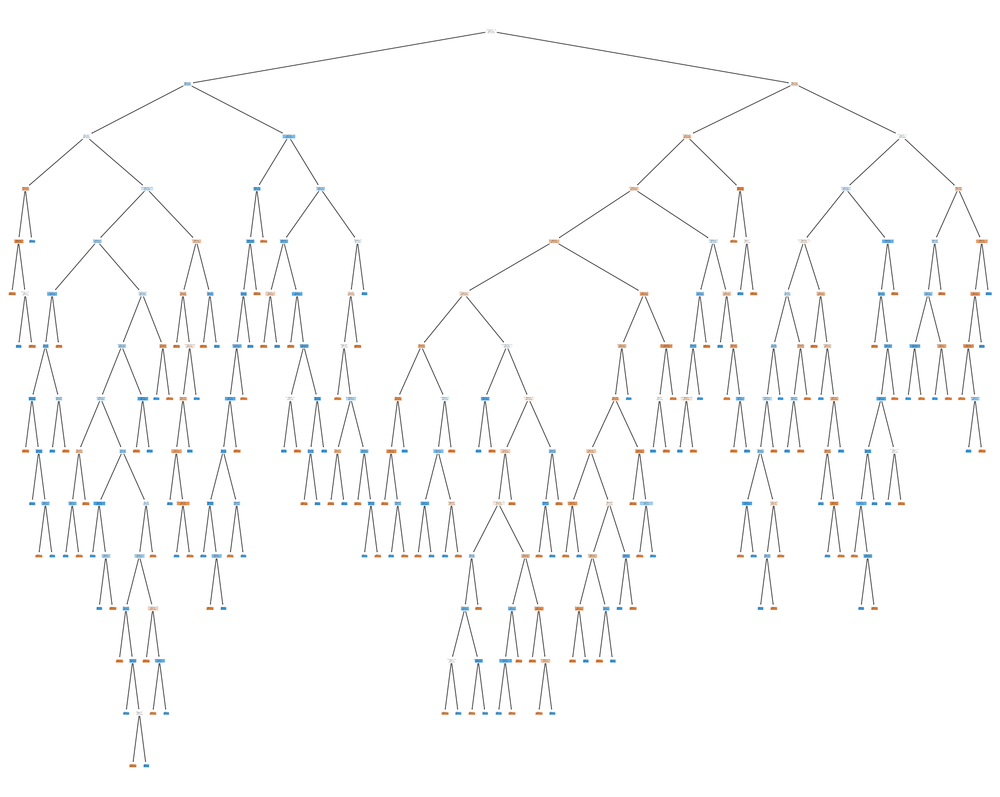

In [ ]:
# lets plot_tree:
plt.figure(figsize=(25,20))
tree.plot_tree(clf,feature_names=df_undersample.columns,class_names=['No Attrition','Attrition'],filled=True);